In [1]:
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from sklearn.model_selection import train_test_split

In [2]:
# Import wandb and log in
import wandb

# Log in to wandb with API key
wandb.login(key='eb4c4a1fa7eec1ffbabc36420ba1166f797d4ac5')

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [3]:
# Paths
train_img_path = "/kaggle/input/martianlunar-crater-detection-dataset/craters/train/images/"
train_lbl_path = "/kaggle/input/martianlunar-crater-detection-dataset/craters/train/labels/"
valid_img_path = "/kaggle/input/martianlunar-crater-detection-dataset/craters/valid/images/"
valid_lbl_path = "/kaggle/input/martianlunar-crater-detection-dataset/craters/valid/labels/"
test_img_path = "/kaggle/input/martianlunar-crater-detection-dataset/craters/test/images/"
test_lbl_path = "/kaggle/input/martianlunar-crater-detection-dataset/craters/test/labels/"
model_path = "/kaggle/input/martianlunar-crater-detection-dataset/best.pt"
data_yaml_path = "/kaggle/working/data.yaml"

In [4]:
# EDA and Data Preprocessing
def load_labels(label_path):
    label_files = os.listdir(label_path)
    data = []
    classes = set()
    for file in label_files:
        with open(os.path.join(label_path, file), 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = list(map(float, line.strip().split()))
                data.append([file, *parts])
                classes.add(int(parts[0]))
    df = pd.DataFrame(data, columns=['file', 'class', 'x_center', 'y_center', 'width', 'height'])
    return df, sorted(classes)

train_labels, train_classes = load_labels(train_lbl_path)
valid_labels, valid_classes = load_labels(valid_lbl_path)
test_labels, test_classes = load_labels(test_lbl_path)

In [5]:
# Get all unique classes
all_classes = sorted(set(train_classes + valid_classes + test_classes))
class_names = [f'class_{i}' for i in all_classes]

In [6]:
# Display first few rows of the labels
print("Train Labels")
print(train_labels.head())
print("\nValidation Labels")
print(valid_labels.head())
print("\nTest Labels")
print(test_labels.head())

Train Labels
                                                file  class  x_center  \
0  mars_crater--21-_jpg.rf.63688e718106a9b061bb70...    0.0  0.485938   
1  mars_crater--21-_jpg.rf.63688e718106a9b061bb70...    0.0  0.149219   
2  mars_crater--21-_jpg.rf.63688e718106a9b061bb70...    0.0  0.603125   
3  mars_crater--21-_jpg.rf.63688e718106a9b061bb70...    0.0  0.221875   
4  mars_crater--21-_jpg.rf.63688e718106a9b061bb70...    0.0  0.355469   

   y_center     width    height  
0  0.253906  0.040625  0.049219  
1  0.290625  0.042188  0.053125  
2  0.437500  0.031250  0.046875  
3  0.539844  0.154688  0.212500  
4  0.561719  0.060937  0.082031  

Validation Labels
                                              file  class  x_center  y_center  \
0  021_png.rf.575e0f1cb87a2cc439172de15816c2cc.txt    0.0  0.197656  0.591406   
1  021_png.rf.575e0f1cb87a2cc439172de15816c2cc.txt    0.0  0.430469  0.710938   
2  021_png.rf.575e0f1cb87a2cc439172de15816c2cc.txt    0.0  0.083594  0.842969   
3

In [7]:
# Create data.yaml
data_yaml_content = f"""
train: {train_img_path}
val: {valid_img_path}
test: {test_img_path}

nc: {len(all_classes)}  # number of classes
names: {class_names}  # class names
"""

with open(data_yaml_path, 'w') as f:
    f.write(data_yaml_content)

In [8]:
# Plotting distribution of bounding box sizes
def plot_bounding_box_distribution(labels, title):
    labels['area'] = labels['width'] * labels['height']
    fig = px.histogram(labels, x='area', nbins=50, title=title)
    fig.show()

plot_bounding_box_distribution(train_labels, 'Train Bounding Box Area Distribution')
plot_bounding_box_distribution(valid_labels, 'Validation Bounding Box Area Distribution')
plot_bounding_box_distribution(test_labels, 'Test Bounding Box Area Distribution')

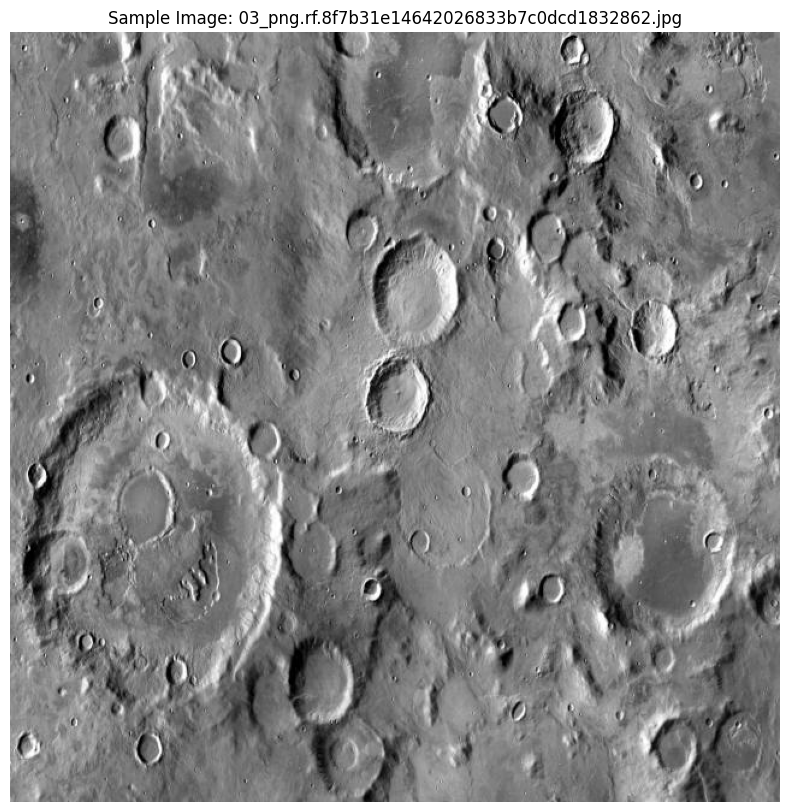

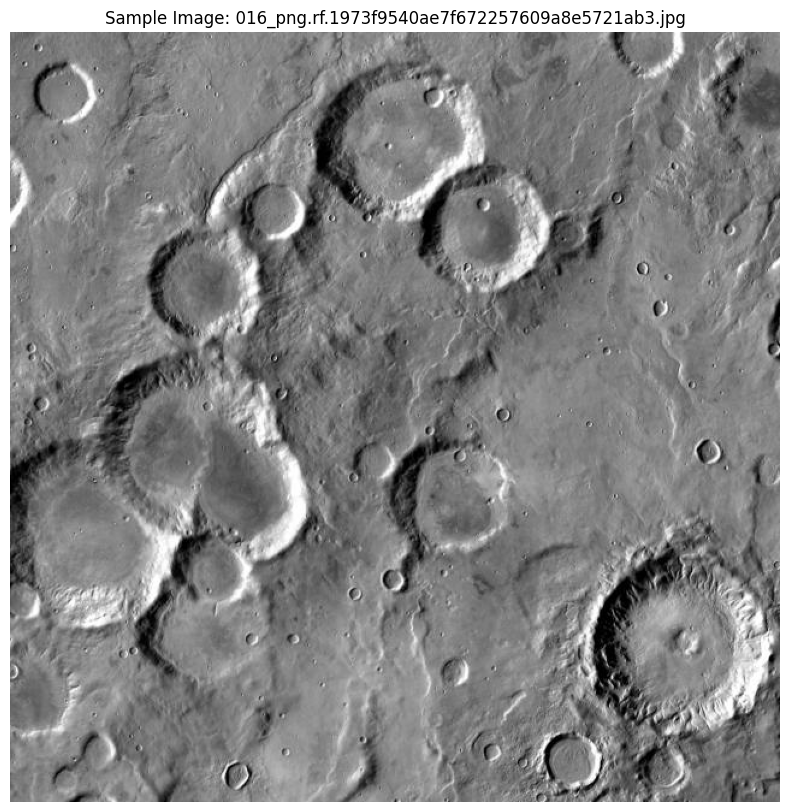

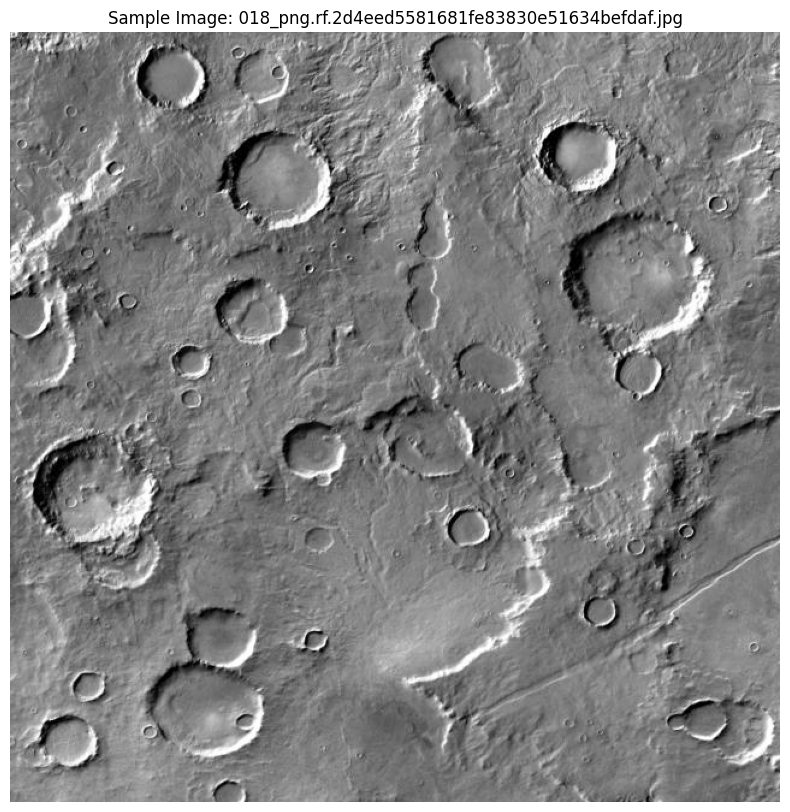

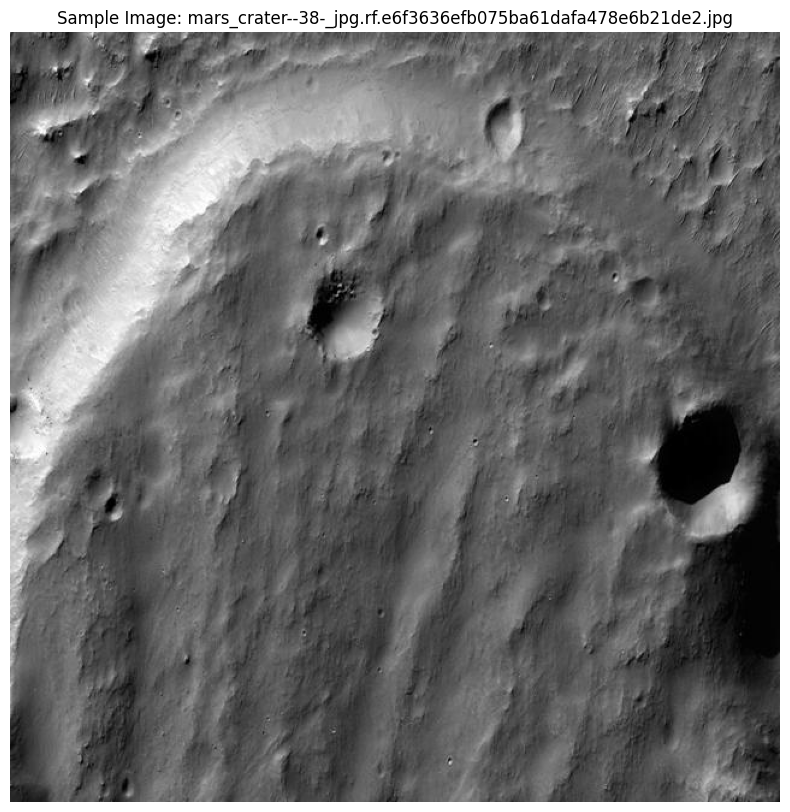

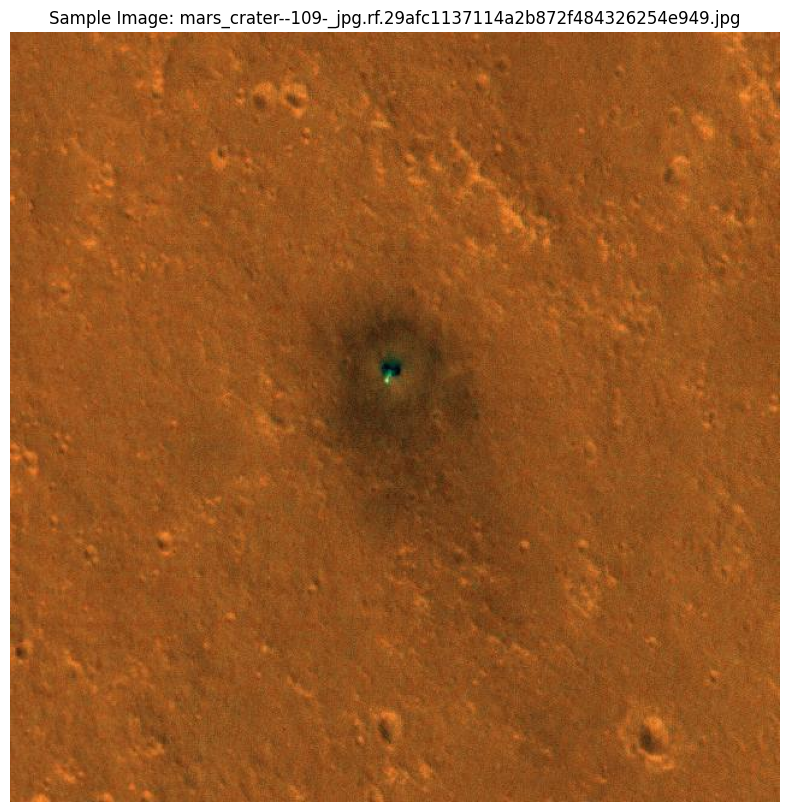

...

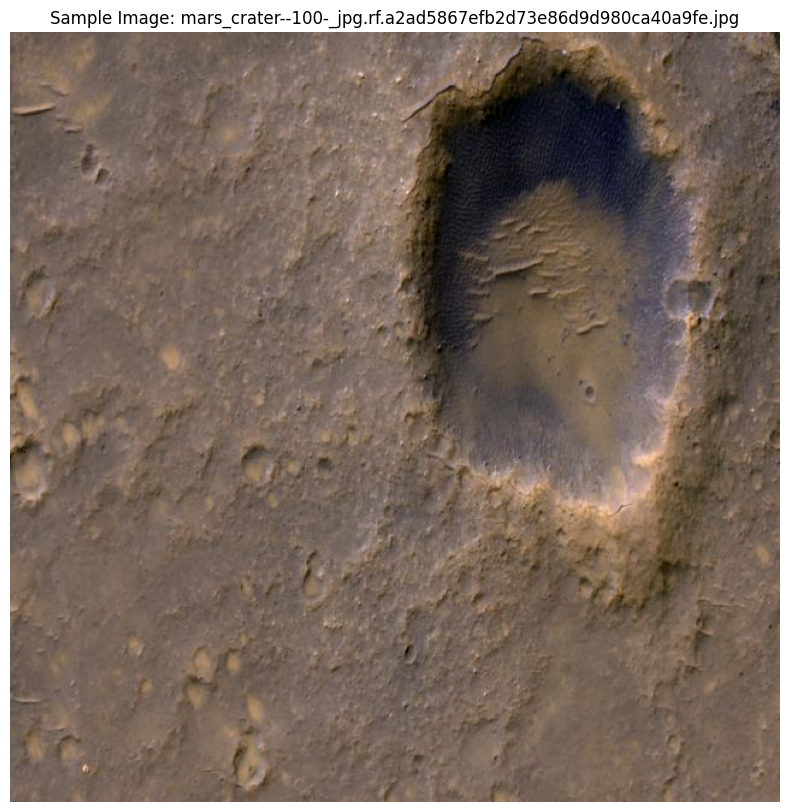

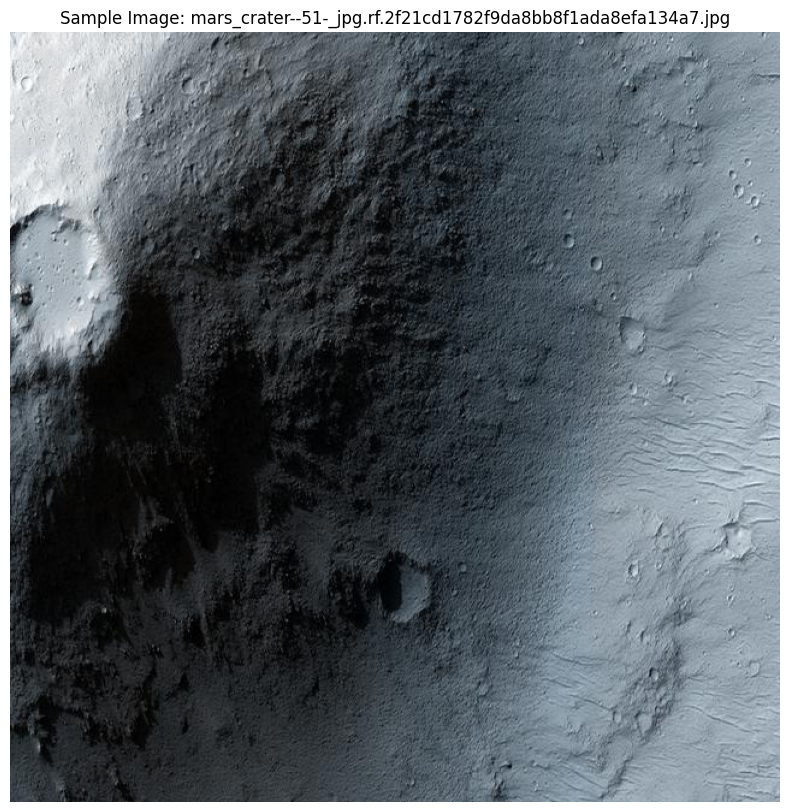

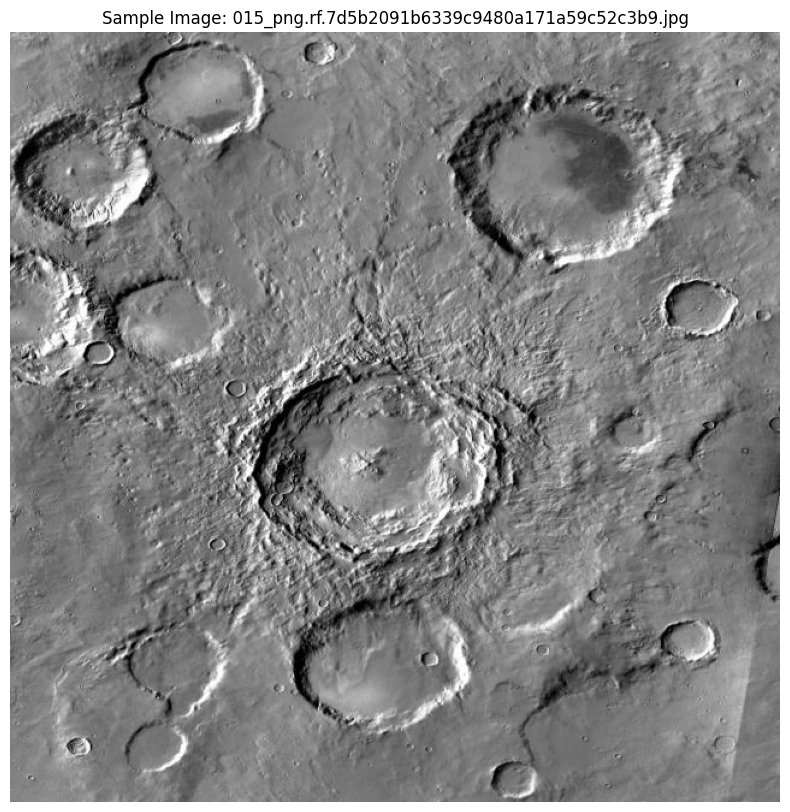

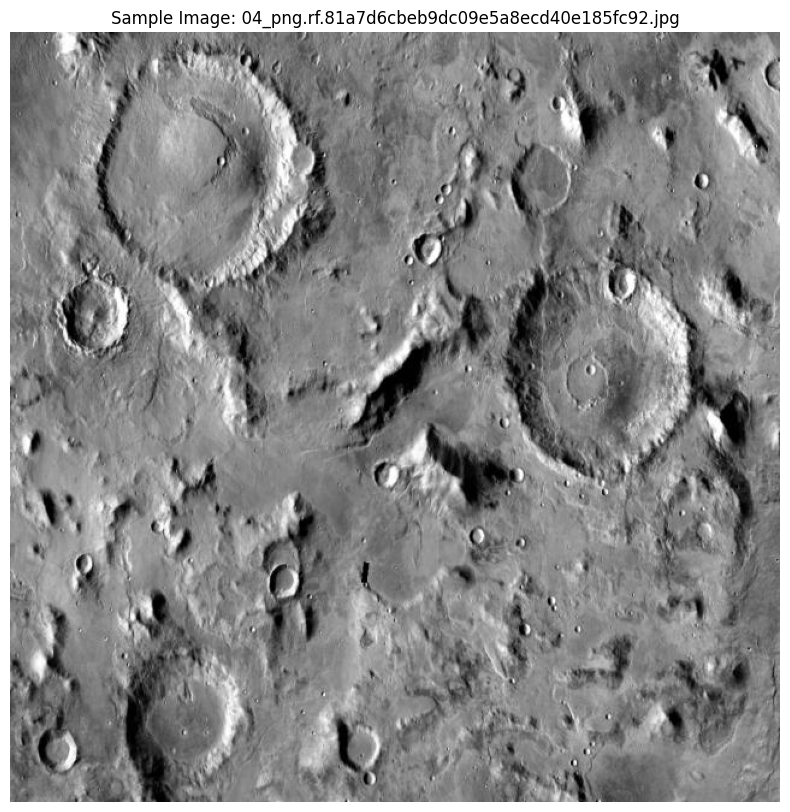

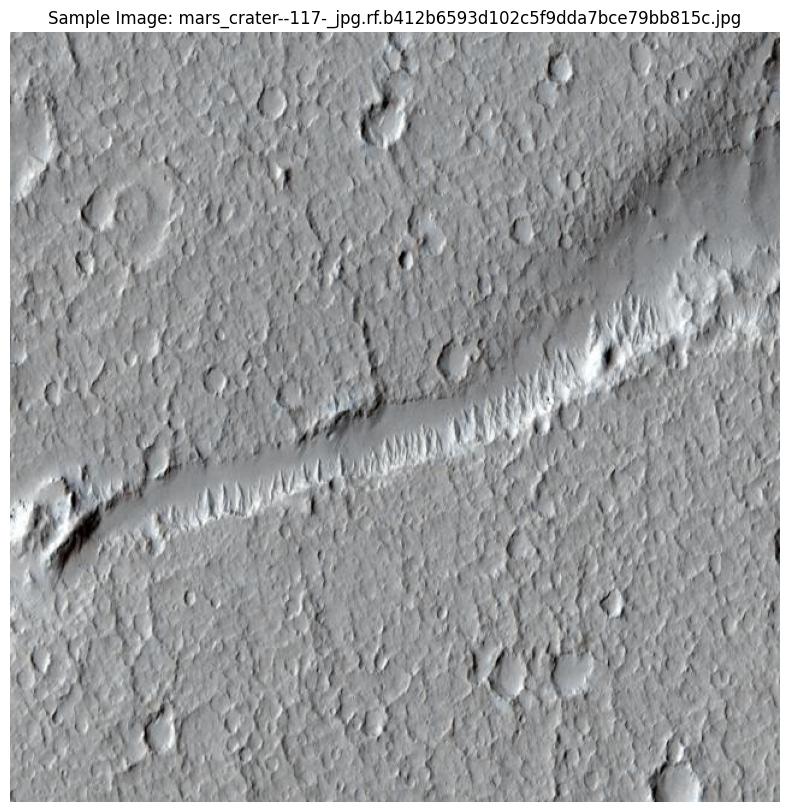

In [9]:
# Image Preprocessing and Visualization
def visualize_sample_images(image_path, label_df, n_samples=5):
    image_files = os.listdir(image_path)[:n_samples]
    for img_file in image_files:
        img_path = os.path.join(image_path, img_file)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        fig, ax = plt.subplots(1, 1, figsize=(10, 10))
        ax.imshow(img)
        
        labels = label_df[label_df['file'] == img_file]
        for _, label in labels.iterrows():
            x_center = int(label['x_center'] * img.shape[1])
            y_center = int(label['y_center'] * img.shape[0])
            width = int(label['width'] * img.shape[1])
            height = int(label['height'] * img.shape[0])
            x_min = x_center - width // 2
            y_min = y_center - height // 2
            
            rect = plt.Rectangle((x_min, y_min), width, height, edgecolor='red', facecolor='none', linewidth=2)
            ax.add_patch(rect)
        
        plt.title(f'Sample Image: {img_file}')
        plt.axis('off')
        plt.show()

visualize_sample_images(train_img_path, train_labels)
visualize_sample_images(valid_img_path, valid_labels)
visualize_sample_images(test_img_path, test_labels)

In [10]:
# YOLOv8 Model Training and Evaluation
!pip install -q ultralytics
from ultralytics import YOLO

In [11]:
# Load the model
model = YOLO('yolov8n.pt')

100%|██████████| 6.25M/6.25M [00:00<00:00, 113MB/s]


In [ ]:
# Train the model
model.train(data=data_yaml_path, epochs=50)

Ultralytics YOLOv8.2.59 🚀 Python-3.10.13 torch-2.1.2+cpu CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=

100%|██████████| 755k/755k [00:00<00:00, 21.2MB/s]
2024-07-18 06:53:45,157	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-07-18 06:53:46,150	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

wandb: Currently logged in as: faf2001f (faf2001f-university-of-engineering-and-technology-taxila). Use `wandb login --relogin` to force relogin


Freezing layer 'model.22.dfl.conv.weight'


train: Scanning /kaggle/input/martianlunar-crater-detection-dataset/craters/train/labels... 98 images, 9 backgrounds, 0 corrupt: 100%|██████████| 98/98 [00:00<00:00, 314.58it/s]

train: WARNING ⚠️ Cache directory /kaggle/input/martianlunar-crater-detection-dataset/craters/train is not writeable, cache not saved.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/martianlunar-crater-detection-dataset/craters/valid/labels... 26 images, 2 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<00:00, 377.23it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/martianlunar-crater-detection-dataset/craters/valid is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50         0G      1.752      3.365      1.415         30        640: 100%|██████████| 7/7 [01:23<00:00, 11.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.84s/it]

                   all         26        202     0.0174      0.673     0.0897     0.0394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         0G      1.505      2.391      1.249         19        640: 100%|██████████| 7/7 [01:15<00:00, 10.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.49s/it]

                   all         26        202     0.0205      0.792      0.216      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50         0G      1.483      1.743      1.179         20        640: 100%|██████████| 7/7 [01:17<00:00, 11.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.52s/it]

                   all         26        202     0.0213      0.822      0.219      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50         0G      1.462      1.676      1.141         10        640: 100%|██████████| 7/7 [01:17<00:00, 11.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.59s/it]

                   all         26        202     0.0224      0.866      0.255      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50         0G      1.528      1.745      1.226          6        640: 100%|██████████| 7/7 [01:17<00:00, 11.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.53s/it]

                   all         26        202      0.671      0.141      0.292      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50         0G      1.501      1.518      1.264          9        640: 100%|██████████| 7/7 [01:17<00:00, 11.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.50s/it]

                   all         26        202      0.368      0.114       0.17     0.0926



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50         0G      1.513      1.523      1.212         16        640: 100%|██████████| 7/7 [01:18<00:00, 11.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.49s/it]

                   all         26        202      0.746      0.183       0.34      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50         0G      1.461      1.428      1.221         23        640: 100%|██████████| 7/7 [01:15<00:00, 10.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.50s/it]

                   all         26        202      0.389      0.248      0.214      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50         0G      1.602      1.639      1.301         15        640: 100%|██████████| 7/7 [01:13<00:00, 10.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.54s/it]

                   all         26        202       0.19      0.163      0.158     0.0813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         0G      1.483      1.527      1.316          9        640: 100%|██████████| 7/7 [01:15<00:00, 10.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.56s/it]

                   all         26        202      0.342      0.302      0.252      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50         0G      1.445      1.416      1.223         21        640: 100%|██████████| 7/7 [01:15<00:00, 10.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.56s/it]

                   all         26        202      0.395      0.378      0.337      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50         0G      1.381      1.495      1.205          6        640: 100%|██████████| 7/7 [01:13<00:00, 10.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.54s/it]

                   all         26        202      0.469       0.47      0.426      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         0G      1.541      1.511      1.251         18        640: 100%|██████████| 7/7 [01:13<00:00, 10.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.57s/it]

                   all         26        202      0.387      0.378      0.348      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50         0G      1.478      1.465      1.202         24        640: 100%|██████████| 7/7 [01:13<00:00, 10.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.51s/it]

                   all         26        202      0.424      0.405      0.331      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50         0G      1.455      1.335      1.174         43        640: 100%|██████████| 7/7 [01:15<00:00, 10.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.54s/it]

                   all         26        202      0.496      0.475      0.465      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50         0G      1.443       1.42      1.178        138        640:  57%|█████▋    | 4/7 [00:48<00:36, 12.00s/it]

In [ ]:
# Evaluate the model
results = model.val()

# Save the trained model
model.save('/kaggle/working/best_model.pt')

In [ ]:
# Visualize sample detections
def visualize_detections(model, image_path, n_samples=10):
    image_files = os.listdir(image_path)[:n_samples]
    for img_file in image_files:
        img_path = os.path.join(image_path, img_file)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        results = model(img_path)
        
        fig, ax = plt.subplots(1, 1, figsize=(10, 10))
        ax.imshow(img)
        
        for result in results[0].boxes:
            x_min, y_min, x_max, y_max = result.xyxy[0].tolist()
            conf = result.conf[0].item()
            rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, edgecolor='red', facecolor='none', linewidth=2)
            ax.add_patch(rect)
            ax.text(x_min, y_min, f'{conf:.2f}', bbox=dict(facecolor='yellow', alpha=0.5))
        
        plt.title(f'Detection in: {img_file}')
        plt.axis('off')
        plt.show()

visualize_detections(model, test_img_path)

print("Model training, evaluation, and sample visualization completed. The trained model is saved at '/kaggle/working/best_model.pt'.")